# Exercise 2

**Due date:** Long overdue 👀

**Learning goals:** calculate scene depth using block matching

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.color import rgb2gray
from skimage.transform import rescale, warp
from tqdm.auto import trange

from middlebury_data_loader import MiddleburyStereoDataset
from utils import rectify, plot_dmaps

In [3]:
ds = MiddleburyStereoDataset()
scene = ds['Classroom1']['perfect']
left, right = rgb2gray(scene.left), rgb2gray(scene.right)

## Task 1: Plot images

In [4]:
def plt_two_imgs(img1, img2, title=''):
    fig, axes = plt.subplots(ncols=2, figsize=(16, 6))
    axes[0].imshow(img1, cmap='gray')
    axes[1].imshow(img2, cmap='gray')
    fig.suptitle(title)
    plt.show()

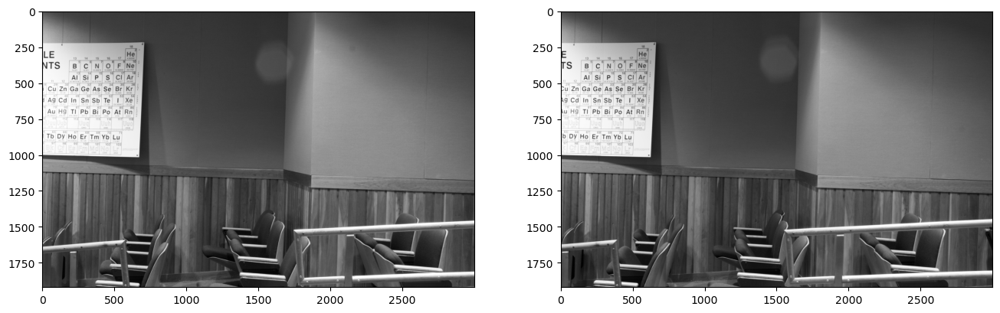

In [5]:
plt_two_imgs(left, right)

start kp extraction.
extraction successful. image1: 5642 kps | image2: 5531 kps.
start matching.
matching successful. matched 3170 kps.
start outlier removal.
outlier removal successful. dropped: 157 kps | remaining: 3013 kps.
calculate transform.
transform calculated.
apply transform.
transform applied.
display matches and transform...


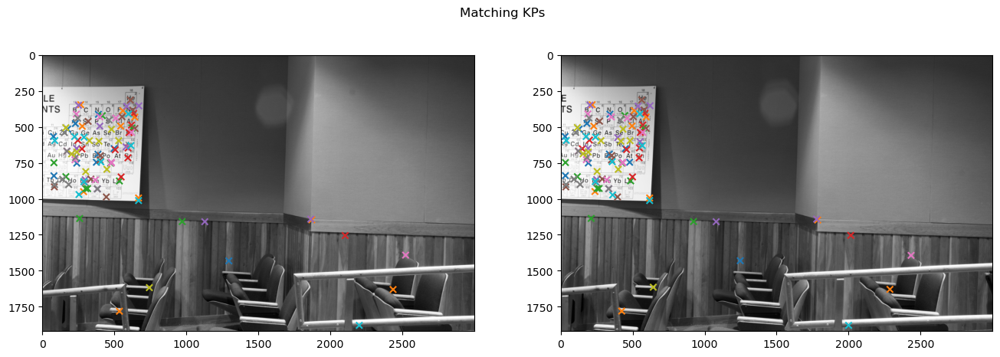

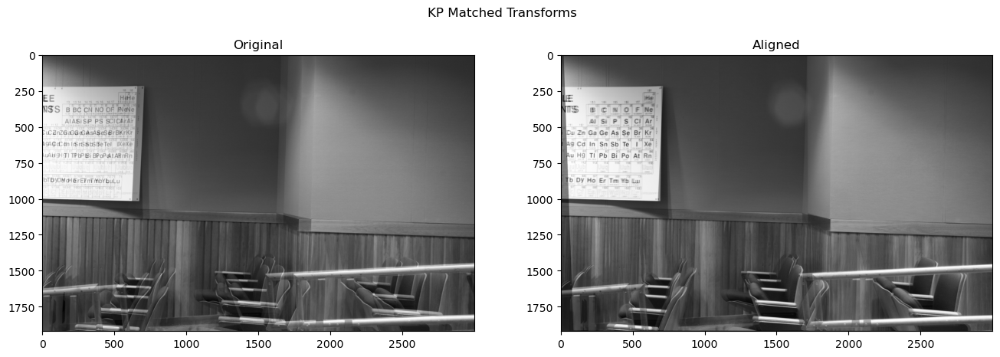

calculate fundamental matrix F.
fundamental matrix calculated.
calculate homography matrices H1, H2.
homography matrices calculated.
apply homography matrices.
display rectified images, with epipolar lines of select keypoints...


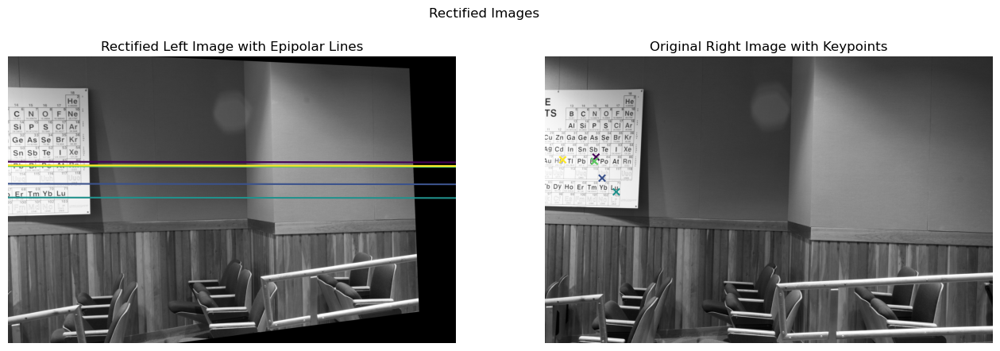

In [6]:
result = rectify(left, right, display=True)
left_rect, right_rect = result['left_rect'], result['right_rect']

## Task 2: calculate Disparity

### Task 2.1: Scanline

#### Implementation

In [7]:
from numpy.lib.stride_tricks import sliding_window_view


def SAD(left, right): return np.abs(left - right).sum(axis=(2, 3))


def SSD(left, right): return ((left - right) ** 2).sum(axis=(2, 3))


def NCC(left, right):
    l = left - left.mean(axis=(2, 3), keepdims=True)
    r = right - right.mean(axis=(2, 3), keepdims=True)
    num = (l * r).sum(axis=(2, 3))
    denom = ((l * l).sum(axis=(2, 3)) * (r * r).sum(axis=(2, 3))) ** .5
    return -num / denom


def scanline(left, right, *, cost_f=SAD, block_size=15):
    H, W = left.shape
    bs = block_size
    dmax = W // 10

    pad = block_size // 2
    left = np.pad(left, ((pad, pad), (pad, pad)), mode='constant')
    right = np.pad(right, ((pad, pad), (pad, pad)), mode='constant')

    left_patches = sliding_window_view(left, (bs, bs))
    right_patches = sliding_window_view(right, (bs, bs))

    cost_vol = np.full((H, W, dmax), np.inf)

    for d in trange(dmax):
        rp = right_patches[:, d:, :, :]
        lp = left_patches[:, :-d or None, :, :]
        cost_vol[:, :-d or None, d] = cost_f(lp, rp)

    return cost_vol.argmin(axis=2)

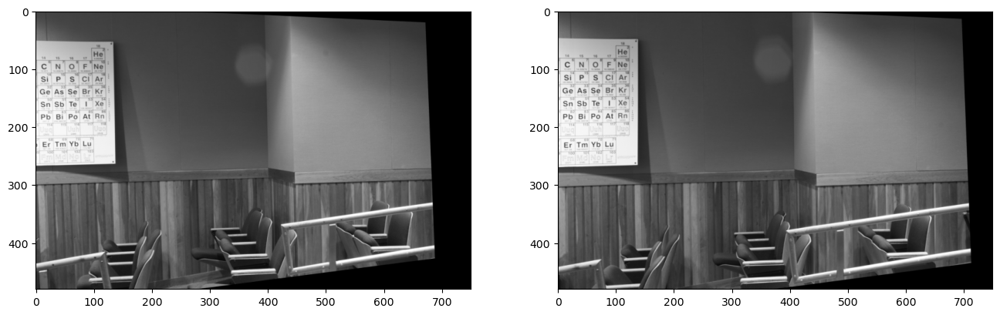

In [8]:
scale = 1 / 4
left_rect_scal, right_rect_scal = rescale(left_rect, scale), rescale(right_rect, scale)
plt_two_imgs(left_rect_scal, right_rect_scal)

In [9]:
disp_sad = scanline(left_rect_scal, right_rect_scal)
disp_ssd = scanline(left_rect_scal, right_rect_scal, cost_f=SSD)
disp_ncc = scanline(left_rect_scal, right_rect_scal, cost_f=NCC)

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

/var/folders/j6/lmzxy6rn54j3rpwwx4zq3xxw0000gp/T/ipykernel_73359/2654452977.py:15: RuntimeWarning: invalid value encountered in divide
  return -num / denom


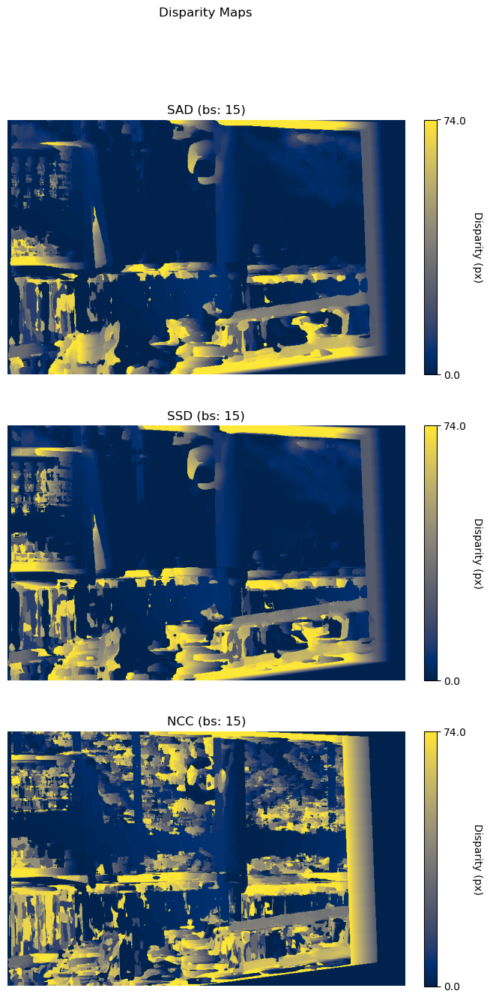

In [10]:
plot_dmaps({'SAD': {15: disp_sad}, 'SSD': {15: disp_ssd}, 'NCC': {15: disp_ncc}})

- SAD and SSD visually equal, NCC unclear.
- You can clearly see that the chairs, which moved the most/are the closest, are also the brightest, while the wall is much darker.
This could be due to the nature of the wall having a uniform color.
- The circle of light was recognized by its outer rims.

Let's try different block sizes. Since SAD and SSD look more or less the same, and NCC is very confusing, we'll just focus on SAD.

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

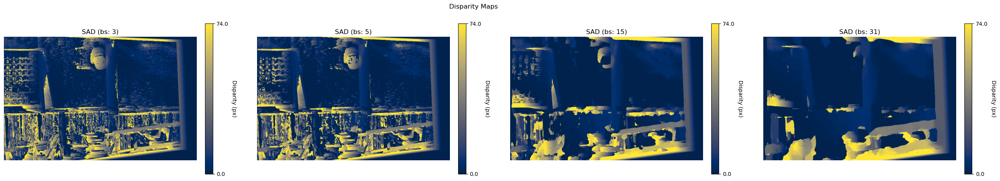

In [11]:
block_sizes = [3, 5, 15, 31]
scan_bs = lambda bs: scanline(left_rect_scal, right_rect_scal, block_size=bs)

plot_dmaps({'SAD': {bs: scan_bs(bs) for bs in block_sizes}})

- Large block sizes
    - Lose details
    - Focussed on a few components
    - Much slower
- Small blocks
    - Noisy
    - Better depicts movement of the whole image

Now, let's create utility functions and test different images.

#### Experiments

In [12]:
from utils import calculate_dmaps

In [13]:
def scanline_pipeline(scene_name):
    scene = ds[scene_name]["perfect"]
    left, right = rgb2gray(scene.left), rgb2gray(scene.right)
    _ = calculate_dmaps(left, right, logging=False, display=True)

SSD - 5:   0%|          | 0/147 [00:00<?, ?it/s]

SSD - 9:   0%|          | 0/147 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/147 [00:00<?, ?it/s]

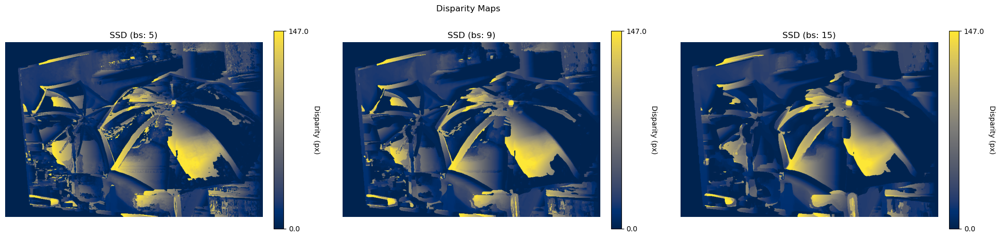

In [14]:
scanline_pipeline('Umbrella')

SSD - 5:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 9:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/142 [00:00<?, ?it/s]

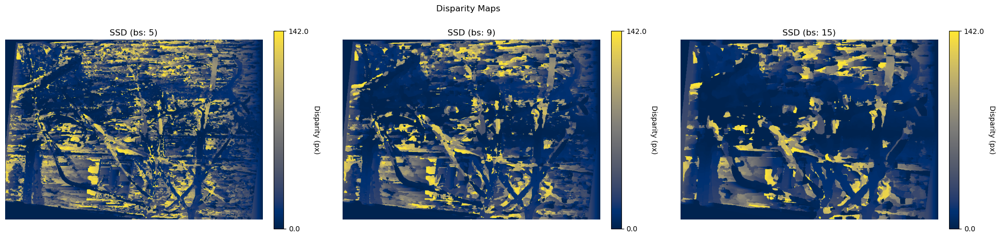

In [15]:
scanline_pipeline('Sticks')

SSD - 5:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 9:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/142 [00:00<?, ?it/s]

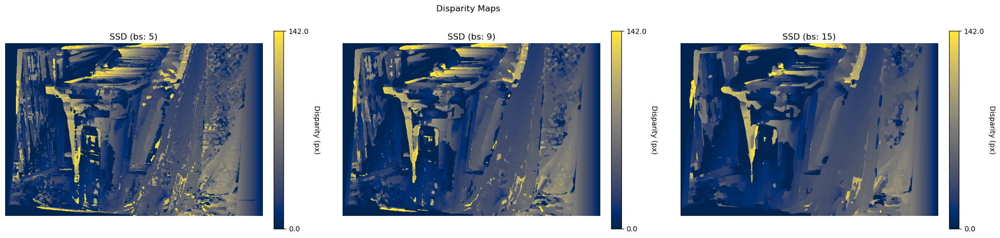

In [16]:
scanline_pipeline('Recycle')

### Task 2.2: Cross-Checking

#### Implementation

In [17]:
from utils import scanline

In [18]:
def cross_check(left, right):
    ltr = scanline(left, right, ltr=True)
    rtl = scanline(left, right, ltr=False)

    H, W = left.shape
    rows = np.arange(H)[:, None]

    xl = np.arange(W)
    xr = xl + ltr
    assert np.all(xr < W)

    match_ok = np.isclose(rtl[rows, xr], -ltr, atol=3)

    return match_ok, ltr

In [19]:
cc_map, sl_dmap = cross_check(left_rect_scal, right_rect_scal)

SSD - 11:   0%|          | 0/149 [00:00<?, ?it/s]

SSD - 11:   0%|          | 0/149 [00:00<?, ?it/s]

In [20]:
left_mask = rescale(result['left_mask'], scale)
cc_map &= left_mask.astype(bool)

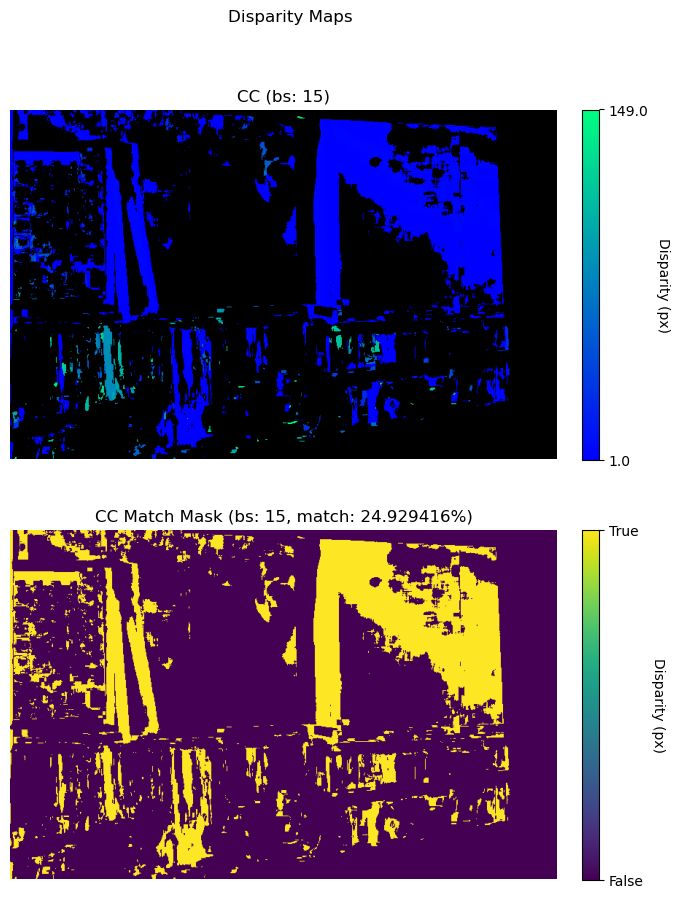

In [21]:
slcc_dmap = sl_dmap.copy().astype(float)
slcc_dmap[~cc_map] = np.nan
plot_dmaps({'CC': {15: slcc_dmap}, 'CC Match Mask': {15: (cc_map, cc_map.sum() / left_mask.sum())}})

 #### Experiments

In [22]:
def cross_check_pipeline(scene_name):
    scene = ds[scene_name]["perfect"]
    left, right = rgb2gray(scene.left), rgb2gray(scene.right)
    _ = calculate_dmaps(left, right, cc=True, cc_cost_f=('SSD', 'NCC'), logging=False, display=True, block_sizes=(5, 15))

SSD - 5:   0%|          | 0/147 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/147 [00:00<?, ?it/s]

SSD - 5:   0%|          | 0/147 [00:00<?, ?it/s]

SSD - 5:   0%|          | 0/147 [00:00<?, ?it/s]

NCC - 5:   0%|          | 0/147 [00:00<?, ?it/s]

/Users/taha.kassabi/PycharmProjects/HHU-Master-Computer-Vision/project2/utils.py:157: RuntimeWarning: invalid value encountered in divide
  return -num / denom


NCC - 5:   0%|          | 0/147 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/147 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/147 [00:00<?, ?it/s]

NCC - 15:   0%|          | 0/147 [00:00<?, ?it/s]

NCC - 15:   0%|          | 0/147 [00:00<?, ?it/s]

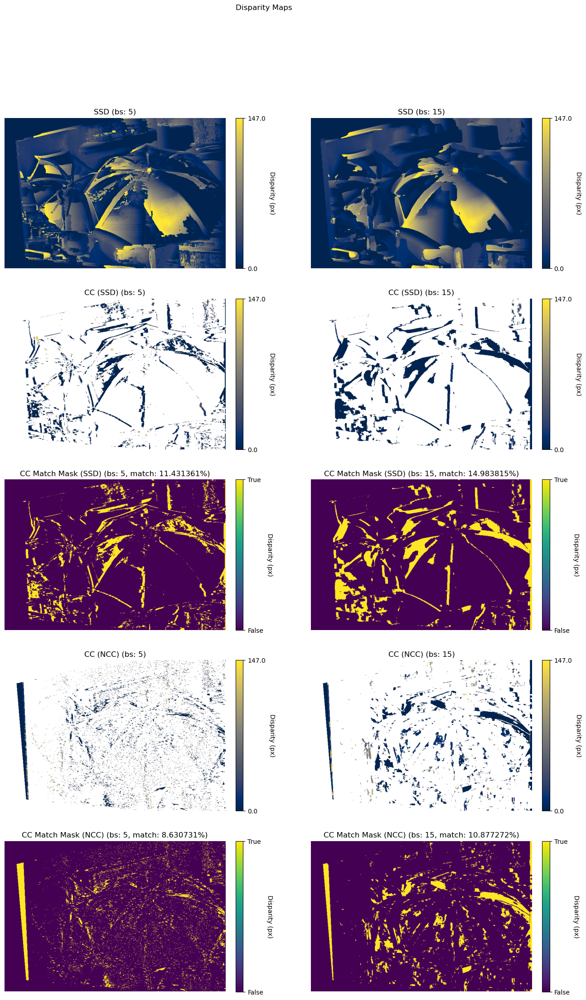

In [23]:
cross_check_pipeline('Umbrella')

SSD - 5:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 5:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 5:   0%|          | 0/142 [00:00<?, ?it/s]

NCC - 5:   0%|          | 0/142 [00:00<?, ?it/s]

/Users/taha.kassabi/PycharmProjects/HHU-Master-Computer-Vision/project2/utils.py:157: RuntimeWarning: invalid value encountered in divide
  return -num / denom


NCC - 5:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/142 [00:00<?, ?it/s]

NCC - 15:   0%|          | 0/142 [00:00<?, ?it/s]

NCC - 15:   0%|          | 0/142 [00:00<?, ?it/s]

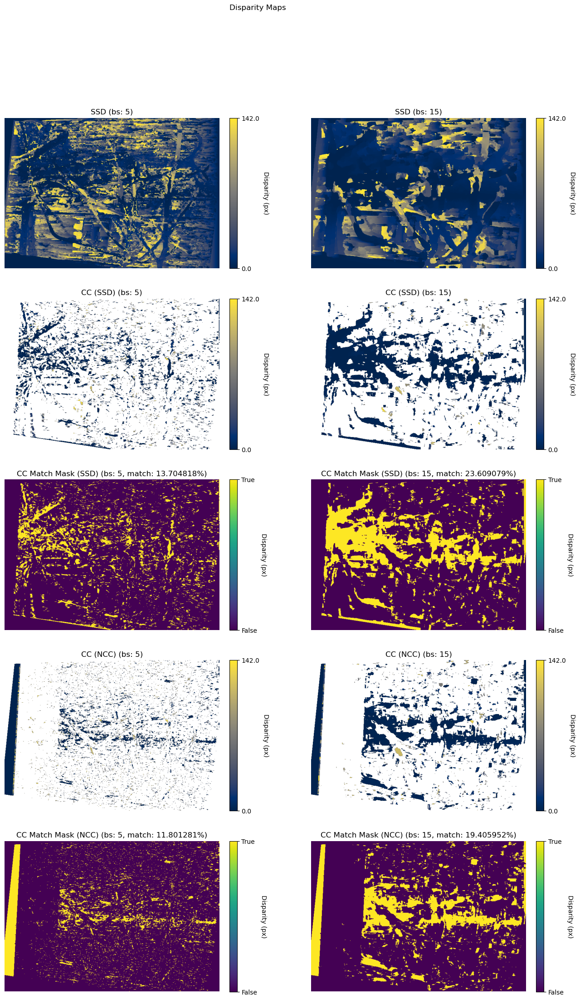

In [24]:
cross_check_pipeline('Sticks')

SSD - 5:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 5:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 5:   0%|          | 0/142 [00:00<?, ?it/s]

NCC - 5:   0%|          | 0/142 [00:00<?, ?it/s]

/Users/taha.kassabi/PycharmProjects/HHU-Master-Computer-Vision/project2/utils.py:157: RuntimeWarning: invalid value encountered in divide
  return -num / denom


NCC - 5:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/142 [00:00<?, ?it/s]

SSD - 15:   0%|          | 0/142 [00:00<?, ?it/s]

NCC - 15:   0%|          | 0/142 [00:00<?, ?it/s]

NCC - 15:   0%|          | 0/142 [00:00<?, ?it/s]

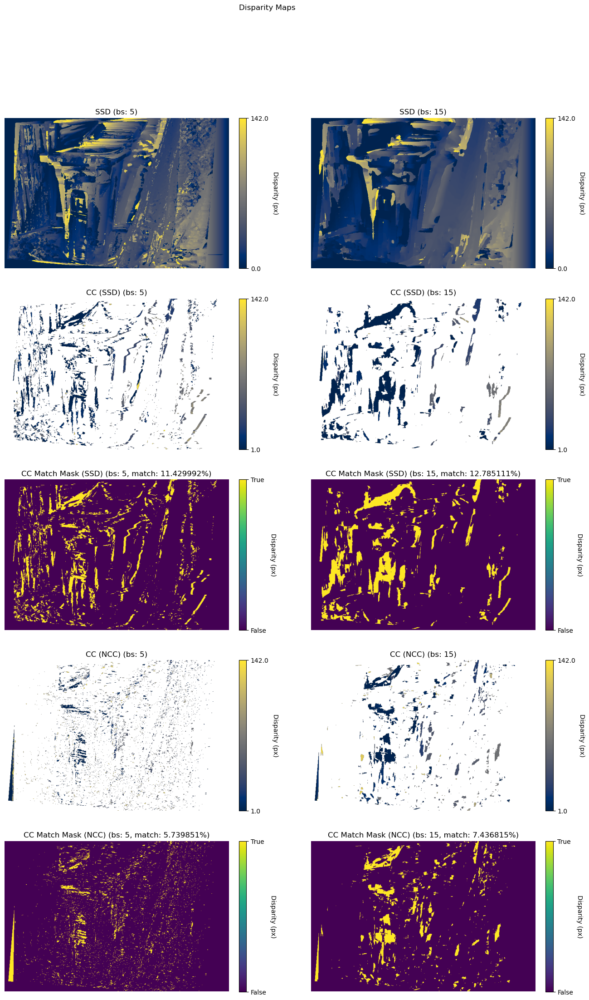

In [25]:
cross_check_pipeline('Recycle')

### Task 2.3: Resolution of Ambiguous Matches